In [ ]:
!pip install torch
!pip install huggingface_hub
!pip install evaluate
!pip install datasets
!pip install transformers triton>=3.4 kernels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 5.5 MB/s eta 0:00:00


#computing shap values and store the result

In [ ]:
from datasets import load_dataset

# Load a custom CSV file
data_files = {"train": "/content/drive/MyDrive/Colab Notebooks/NLU_project/HC3_dataset/train.csv", "val": "/content/drive/MyDrive/Colab Notebooks/NLU_project/HC3_dataset/val.csv", "test": "/content/drive/MyDrive/Colab Notebooks/NLU_project/HC3_dataset/test.csv"}
dataset = load_dataset("csv", data_files=data_files)

In [ ]:
from transformers import AutoModelForSequenceClassification, AutoTokenizer

model_dir = "/content/drive/MyDrive/Colab Notebooks/NLU_project/models_2"
loaded_model = AutoModelForSequenceClassification.from_pretrained(model_dir).cuda()
loaded_tokenizer = AutoTokenizer.from_pretrained(model_dir)

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

In [ ]:
def tokenize_function(examples):
    texts = [str(t) if t is not None else "" for t in examples["text"]]
    return loaded_tokenizer(texts, padding="max_length", truncation=True, max_length=512)

# Apply the tokenizer to the dataset
tokenized_datasets = dataset.map(tokenize_function, batched=True)

Map:   0%|          | 0/64508 [00:00<?, ? examples/s]

Map:   0%|          | 0/8494 [00:00<?, ? examples/s]

Map:   0%|          | 0/8471 [00:00<?, ? examples/s]

Map:   0%|          | 0/4864 [00:00<?, ? examples/s]

Map:   0%|          | 0/44868 [00:00<?, ? examples/s]

In [ ]:
import numpy as np
import scipy as sp
import shap
import torch
# from shap library
# define a prediction function
def f(x):
    tv = torch.tensor([loaded_tokenizer.encode(v, padding="max_length", max_length=500, truncation=True) for v in x]).cuda()
    outputs = loaded_model(tv)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:, 1])  # use one vs rest logit units
    return val

# Create SHAP explainer
explainer = shap.Explainer(f, loaded_tokenizer)
shap_values = explainer(tokenized_datasets['test']['text'], fixed_context=1)

PartitionExplainer explainer:  54%|█████▍    | 4570/8471 [25:20<25:27,  2.55it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 8472it [57:55,  2.43it/s]


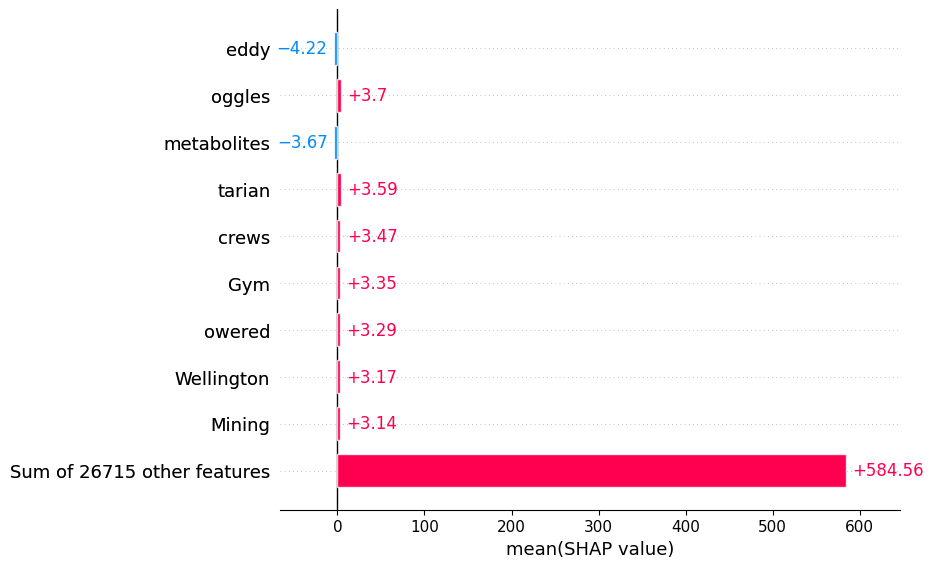

In [ ]:
shap.plots.bar(shap_values.mean(0))

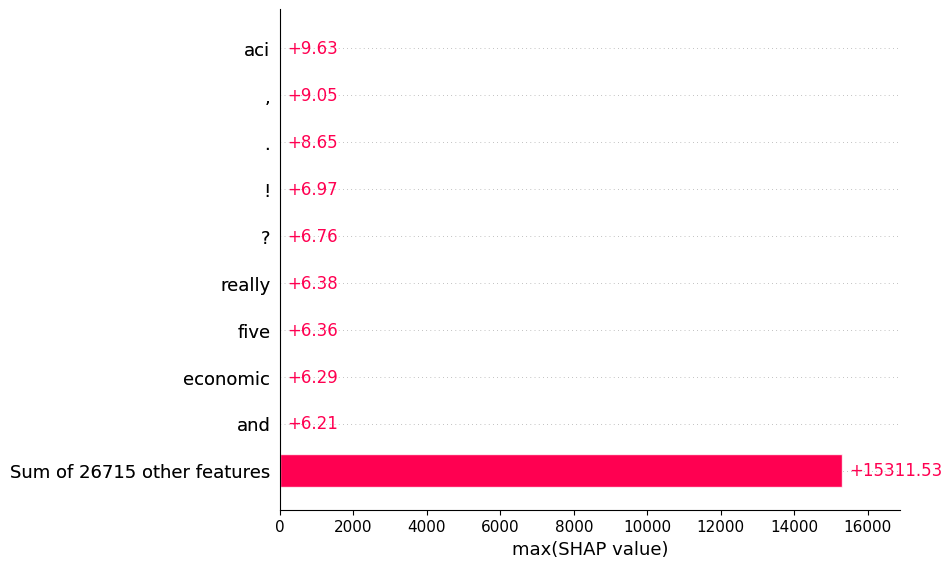

In [ ]:
shap.plots.bar(shap_values.max(0))

In [ ]:
# Visualize explanations
shap.plots.text(shap_values[0])

In [ ]:
shap_values

.values =
array([array([ 1.22460504e+00,  1.40136285e+00,  9.61177307e-01,  9.15767151e-01,
               8.44960588e-01,  7.96132582e-01,  1.11939895e-01,  1.85670245e-01,
              -3.14529513e-01, -4.27688767e-01,  1.77190029e-01, -5.44584582e-04,
               1.89569583e+00,  6.19149813e-01, -4.00971559e-01,  2.61416516e+00,
               9.41455684e-02, -8.16010682e-01, -3.03720215e+00, -1.83805449e+00,
              -3.31477926e-01,  1.04342813e+00, -1.83134368e-01, -7.81540187e-02,
               5.94360017e-01,  2.56611837e-01])                                 ,
       array([-0.12384948,  0.41911927,  0.5727651 ,  0.74854635, -0.20457865,
               0.34177552,  1.25382095,  0.9999147 , -1.23055405, -0.17586655,
               0.30850845, -0.8203978 ,  0.2889772 ,  0.3202272 ,  0.51163345,
               1.58975845, -0.41610092, -2.86531967, -3.27498764,  0.23673111,
               0.51505142, -0.79354233,  0.44126398,  0.35825617,  0.91294367,
               1.016

In [ ]:
import joblib

# storing shap_values
joblib.dump(shap_values, 'old_full_processed.joblib')

['shap_explanation.joblib']

# using stored shap values

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# using loaded shap value, new model
import joblib
shap_values_new = joblib.load('/content/drive/MyDrive/Colab Notebooks/NLU_project/shap_value/new_full_processed.joblib')

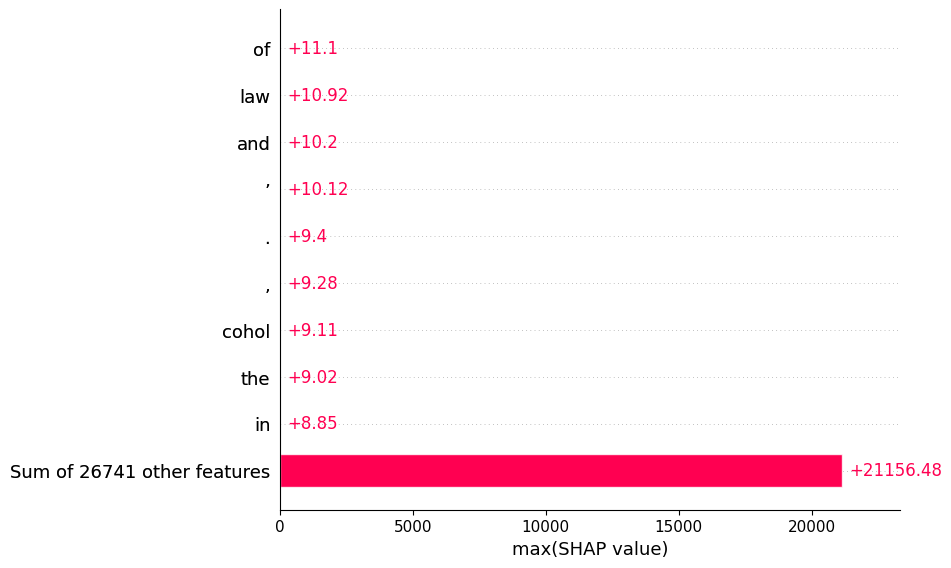

In [10]:
shap.plots.bar(shap_values_new.max(0))
# Visualize explanations
#shap.plots.text(shap_values[0])

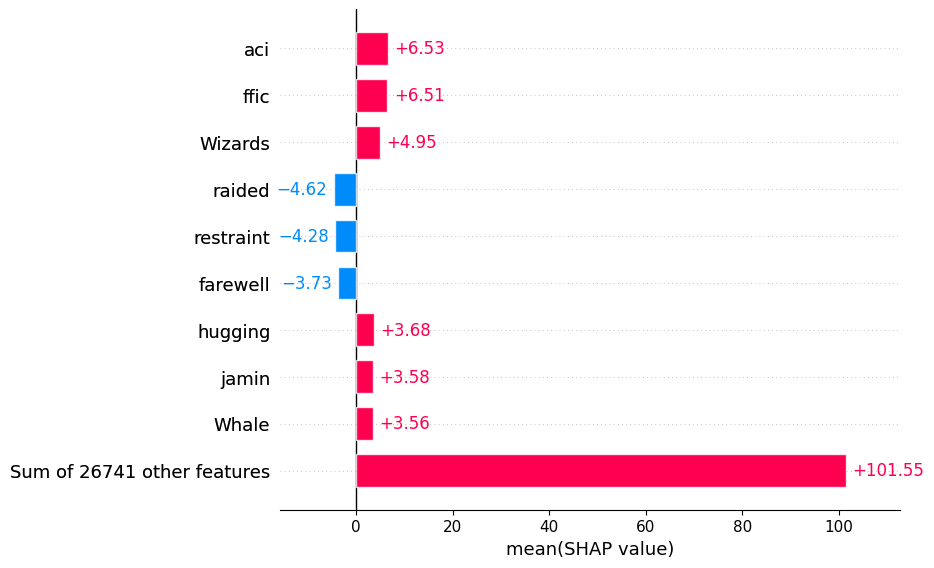

In [11]:
shap.plots.bar(shap_values_new.mean(0))

In [ ]:
shap_values_old = joblib.load('/content/drive/MyDrive/Colab Notebooks/NLU_project/shap_value/old_full.joblib')

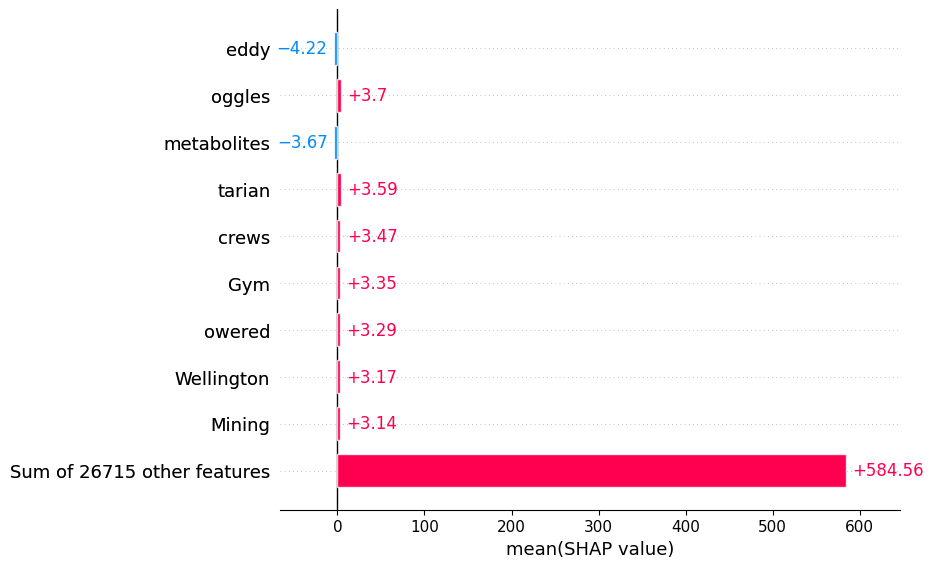

In [12]:
import shap
import matplotlib.pyplot as plt
shap.plots.bar(shap_values_old.mean(0))

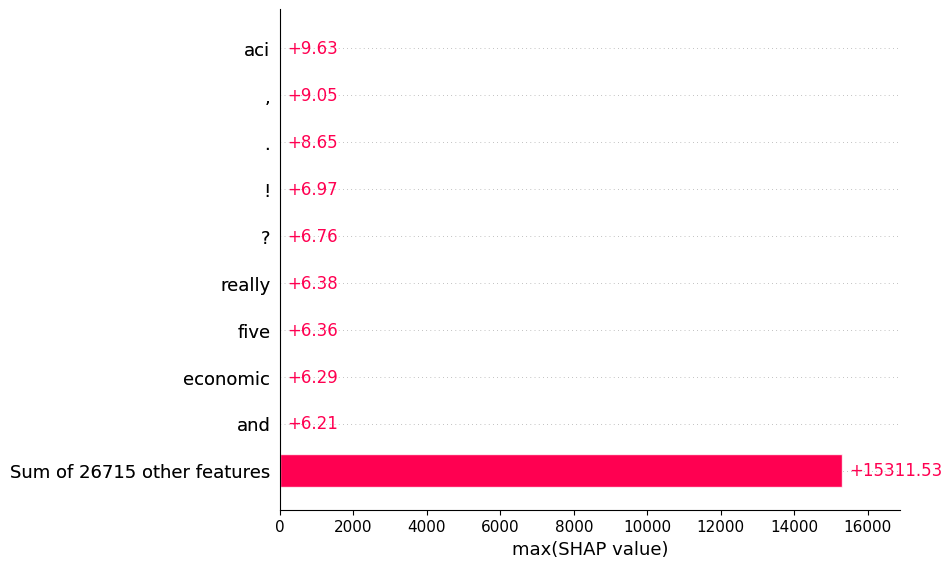

Text(0.5, 1.0, 'old_SHAP_max')

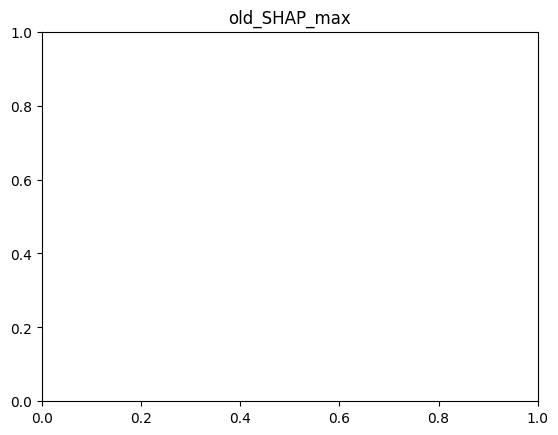

In [13]:
shap.plots.bar(shap_values_old.max(0))
plt.title('old_SHAP_max')

In [15]:
shap.plots.text(shap_values_old[0])